# TC 5033
## Deep Learning
## Convolutional Neural Networks
<br>

#### Activity 2b: Building a CNN for CIFAR10 dataset with PyTorch
<br>

Juan Antonio Chiñas Mata: A01794191 <br>
José Alejandro Cortés Pérez: A01795033 <br>
Moises Flores Ortíz: A01795489 <br>
Mardonio Manuel Román Ramírez: A01795265 <br>
Miriam Eunice Rosas Medellín: A01795550 <br><br>

- Objective

    The main goal of this activity is to further your understanding of Convolutional Neural Networks (CNNs) by building one using PyTorch. You will apply this architecture to the famous CIFAR10 dataset, taking what you've learned from the guide code that replicated the Fully Connected model in PyTorch (Activity 2a).

- Instructions
    This activity requires submission in teams of 5 or 6 members. Submissions from smaller or larger teams will not be accepted unless prior approval has been granted (only due to exceptional circumstances). While teamwork is encouraged, each member is expected to contribute individually to the assignment. The final submission should feature the best arguments and solutions from each team member. Only one person per team needs to submit the completed work, but it is imperative that the names of all team members are listed in a Markdown cell at the very beginning of the notebook (either the first or second cell). Failure to include all team member names will result in the grade being awarded solely to the individual who submitted the assignment, with zero points given to other team members (no exceptions will be made to this rule).

    Understand the Guide Code: Review the guide code from Activity 2a that implemented a Fully Connected model in PyTorch. Note how PyTorch makes it easier to implement neural networks.

    Familiarize Yourself with CNNs: Take some time to understand their architecture and the rationale behind using convolutional layers.

    Prepare the Dataset: Use PyTorch's DataLoader to manage the dataset. Make sure the data is appropriately preprocessed for a CNN.

    Design the CNN Architecture: Create a new architecture that incorporates convolutional layers. Use PyTorch modules like nn.Conv2d, nn.MaxPool2d, and others to build your network.

    Training Loop and Backpropagation: Implement the training loop, leveraging PyTorch’s autograd for backpropagation. Keep track of relevant performance metrics.

    Analyze and Document: Use Markdown cells to explain your architectural decisions, performance results, and any challenges you faced. Compare this model with your previous Fully Connected model in terms of performance and efficiency.

- Evaluation Criteria

    - Understanding of CNN architecture and its application to the CIFAR10 dataset
    - Code Readability and Comments
    - Appropriateness and efficiency of the chosen CNN architecture
    - Correct implementation of Traning Loop and Accuracy Function
    - Model's performance metrics on the CIFAR10 dataset (at least 65% accuracy)
    - Quality of Markdown documentation

- Submission

Submit via Canvas your Jupyter Notebook with the CNN implemented in PyTorch. Your submission should include well-commented code and Markdown cells that provide a comprehensive view of your design decisions, performance metrics, and learnings.

In [1]:
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torch.utils.data import sampler
import torchvision.datasets as datasets
import torchvision.transforms as T
import matplotlib.pyplot as plt

### Download Cifar10 dataset

In [2]:
torch.cuda.is_available()

True

In [3]:
DATA_PATH = 'CIFAR10/'
NUM_TRAIN = 50000
NUM_VAL = 5000
NUM_TEST = 5000
MINIBATCH_SIZE = 64

transform_cifar = T.Compose([
                T.ToTensor(),
                T.Normalize([0.491, 0.482, 0.447], [0.247, 0.243, 0.261])
            ])

# Train dataset
cifar10_train = datasets.CIFAR10(DATA_PATH, train=True, download=True,
                             transform=transform_cifar)
train_loader = DataLoader(cifar10_train, batch_size=MINIBATCH_SIZE, 
                          sampler=sampler.SubsetRandomSampler(range(NUM_TRAIN)))
#Validation set
cifar10_val = datasets.CIFAR10(DATA_PATH, train=False, download=True,
                           transform=transform_cifar)
val_loader = DataLoader(cifar10_val, batch_size=MINIBATCH_SIZE, 
                        sampler=sampler.SubsetRandomSampler(range(NUM_VAL)))
#Test set
cifar10_test = datasets.CIFAR10(DATA_PATH, train=False, download=True, 
                            transform=transform_cifar)
test_loader = DataLoader(cifar10_test, batch_size=MINIBATCH_SIZE,
                        sampler=sampler.SubsetRandomSampler(range(NUM_VAL, len(cifar10_test))))

Files already downloaded and verified
Files already downloaded and verified
Files already downloaded and verified


In [4]:
# Exploring the object
cifar10_train

Dataset CIFAR10
    Number of datapoints: 50000
    Root location: CIFAR10/
    Split: Train
    StandardTransform
Transform: Compose(
               ToTensor()
               Normalize(mean=[0.491, 0.482, 0.447], std=[0.247, 0.243, 0.261])
           )

In [5]:
# Printing Batch size
train_loader.batch_size

64

In [6]:
# Printing data from data loader
for i, (x, y) in enumerate(train_loader):
    print(x, y)


tensor([[[[ 1.6638e+00,  1.6162e+00,  1.6162e+00,  ...,  1.7591e+00,
            1.7432e+00,  1.8861e+00],
          [ 9.3348e-01,  8.6997e-01,  1.0764e+00,  ...,  1.1399e+00,
            1.3304e+00,  1.7908e+00],
          [-3.0491e-01, -1.4615e-01,  4.5717e-01,  ...,  9.3348e-01,
            1.0129e+00,  1.3463e+00],
          ...,
          [-4.3193e-01, -3.6842e-01, -3.3667e-01,  ...,  7.6129e-02,
           -1.9132e-02, -6.6762e-02],
          [-3.5254e-01, -3.3667e-01, -2.2553e-01,  ...,  2.8499e-02,
           -5.0885e-02, -1.3027e-01],
          [-3.2079e-01, -2.2553e-01, -1.3027e-01,  ..., -3.5008e-02,
           -9.8516e-02, -1.7790e-01]],

         [[ 1.7766e+00,  1.7444e+00,  1.7282e+00,  ...,  1.8251e+00,
            1.8251e+00,  1.9542e+00],
          [ 1.0827e+00,  1.0182e+00,  1.2280e+00,  ...,  1.1473e+00,
            1.4055e+00,  1.8573e+00],
          [-6.3100e-02,  9.8281e-02,  6.9539e-01,  ...,  8.8905e-01,
            1.0343e+00,  1.4216e+00],
          ...,
     

### Using  GPUs

In [7]:
# Setting cuada as device
if torch.cuda.is_available():
    device = torch.device('cuda')
else:
    device = torch.device('cpu')
print(device)

cuda


### Mostrar imágenes

La imagen muestreada representa un: cat


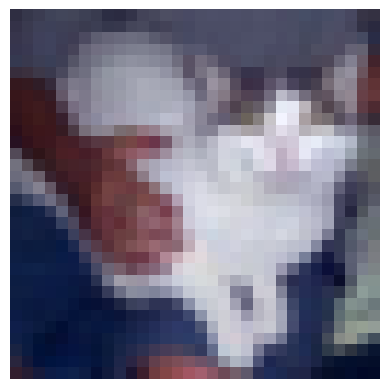

In [8]:
# Function to show images
classes = test_loader.dataset.classes
def plot_figure(image):
    plt.imshow(np.transpose(image,(1,2,0)))
    plt.axis('off')
    plt.show()

rnd_sample_idx = np.random.randint(len(test_loader))
print(f'La imagen muestreada representa un: {classes[test_loader.dataset[rnd_sample_idx][1]]}')
image = test_loader.dataset[rnd_sample_idx][0]
image = (image - image.min()) / (image.max() -image.min() )
plot_figure(image)


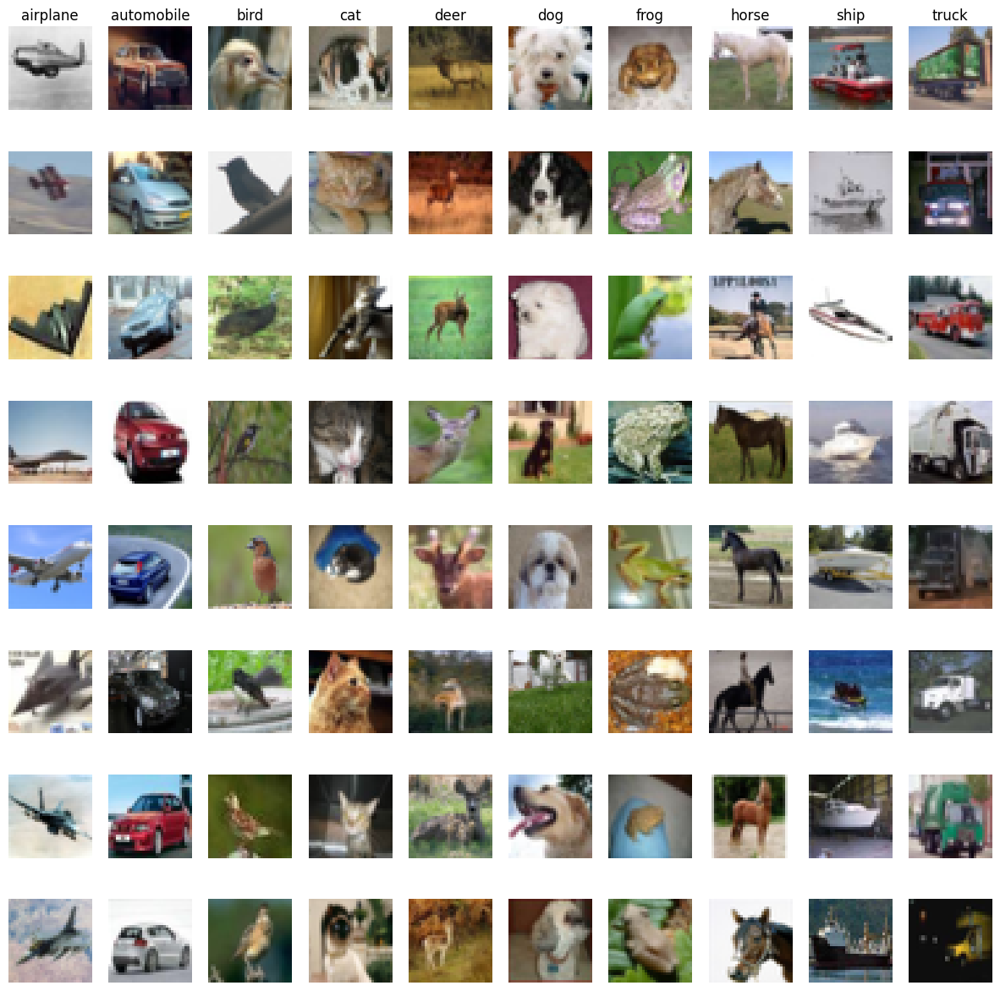

In [9]:
# Function to randomly show 8 images by class in a grid
def plot_cifar10_grid():
    classes = test_loader.dataset.classes
    total_samples = 8
    plt.figure(figsize=(15,15))
    for label, sample in enumerate(classes):
        class_idxs = np.flatnonzero(label == np.array(test_loader.dataset.targets))
        sample_idxs = np.random.choice(class_idxs, total_samples, replace = False)
        for i, idx in enumerate(sample_idxs):
            plt_idx = i*len(classes) + label + 1
            plt.subplot(total_samples, len(classes), plt_idx)
            plt.imshow(test_loader.dataset.data[idx])
            plt.axis('off')
            
            if i == 0: plt.title(sample)
    plt.show()

plot_cifar10_grid() 

### Calcular accuracy


In [10]:
def accuracy(model, loader):
    num_correct = 0
    num_total = 0
    model.eval()    # Ponemos el modelo en modo evaluación
    model = model.to(device=device) # Nos aseguramos que el modelo esté en GPUs
    with torch.no_grad():
        for xi, yi in loader:
            xi = xi.to(device=device, dtype = torch.float32)
            yi = yi.to(device=device, dtype = torch.long)
            scores = model(xi) 
            _, pred = scores.max(dim=1) 
            num_correct += (pred == yi).sum() # Comparamos la predicción con los elementos de la clase correcta
            num_total += pred.size(0)
        return float(num_correct)/num_total   # Elementos predichos entre total de elementos

### Loop de entrenamiento

In [11]:
# Función train sin scheduler
def train_no_scheduler(model, optimiser, epochs=100):
    model = model.to(device=device)
    for epoch in range(epochs):
        for i, (xi, yi) in enumerate(train_loader):
            model.train()
            xi = xi.to(device=device, dtype=torch.float32)
            yi = yi.to(device=device, dtype=torch.long)
            scores = model(xi)

            cost = F.cross_entropy(input= scores, target=yi)
        
            optimiser.zero_grad()           
            cost.backward()
            optimiser.step()           
            
        acc = accuracy(model, val_loader) 
        print(f'Epoch: {epoch}, cost: {cost.item()}, accuracy: {acc},')

In [12]:
# Funcion con scheduler
def train(model, optimiser, scheduler, epochs=100):
    """
    Trains a model using a specified optimizer and scheduler for a given number of epochs.

    Args:
        model (torch.nn.Module): The model to be trained.
        optimiser (torch.optim.Optimizer): The optimizer used to update the model's parameters.
        scheduler (torch.optim.lr_scheduler): The learning rate scheduler used to adjust the learning rate.
        epochs (int, optional): The number of epochs to train the model. Defaults to 100.

    Returns:
        None

    The function trains the model in the following steps:
    1. Moves the model to the specified device (GPU or CPU).
    2. Iterates over the specified number of epochs.
    3. For each epoch, it performs the following:
        - Iterates over the training data loader.
        - Sets the model to training mode.
        - Moves input data and labels to the specified device.
        - Performs a forward pass to compute predictions.
        - Computes the cross-entropy loss between predictions and ground truth.
        - Performs a backward pass to compute gradients.
        - Updates the model parameters using the optimizer.
        - Evaluates the model on the validation set after every epoch.
        - Prints the current epoch, loss, and accuracy.
        - Updates the learning rate based on the scheduler.
    """
    # Move the model to the specified device
    model = model.to(device=device)

    # Iterate over the specified number of epochs
    for epoch in range(epochs):
        # Iterate through the training data loader
        for i, (xi, yi) in enumerate(train_loader):
            # Set the model to training mode
            model.train()

            # Move inputs and labels to the specified device and set data types
            xi = xi.to(device=device, dtype=torch.float32)
            yi = yi.to(device=device, dtype=torch.long)

            # Forward pass: Get model's predictions
            scores = model(xi)

            # Compute the cross-entropy loss
            cost = F.cross_entropy(input=scores, target=yi)

            # Zero the gradients of the optimiser
            optimiser.zero_grad()

            # Backward pass: Compute gradients
            cost.backward()

            # Update the model's parameters
            optimiser.step()

        # Evaluate the model on the validation set after each epoch
        acc = accuracy(model, val_loader)

        # Print the current epoch, loss, and accuracy
        print(f'Epoch: {epoch}, Loss: {cost.item()}, Accuracy: {acc}')

        scheduler.step()

# LINEAR MODEL

### Baseline Linear Model Justification

Before building a more complex convolutional neural network, we first implement a simpler baseline model using fully connected (linear) layers. This model serves as a point of comparison to understand the performance gains of more complex architectures on the CIFAR-10 dataset.

Design of a linear model with two hidden layers of 256 nodes. A standard of 10 epochs has been chosen to accelerate the training process. The purpose of this model is to have a judging bar for the CNN we are about to design.

As we know from our lectures, CNN are well suited for datasets that have some sort of connection or strong relationship between close samples. Examples of this type of data are time-series, audio and most notably, images.

CIFAR-10 is an image dataset that is commonly used to judge the performance of CNNs and other Image Classifying models. One characteristic is that the dataset is colored, meaning it contains 3 channels for each of the RGB colors. This makes it substantially more complex than the MNIST dataset and therefore, to achieve good performance, a more robust approach is required.

#### 1. *Model Architecture*:
   The baseline model, *model1*, is a simple feedforward neural network with two hidden layers. The architecture is as follows:
   - The input image (32x32x3) is flattened into a vector of size *3072*.
   - Two fully connected layers (hidden layers) are used, each with *256 units*.
   - The output layer is a *10-unit* layer, corresponding to the 10 classes in the CIFAR-10 dataset.

#### 2. *Hidden Layers*:
   - The hidden layers consist of *256 units each*. This size was chosen to provide the model with enough capacity to learn useful features without introducing too many parameters that might lead to overfitting.
   - Each hidden layer is followed by a *ReLU activation* function to introduce non-linearity, enabling the model to capture more complex patterns in the data.

#### 3. *Output Layer*:
   - The final layer is a *linear output layer* with 10 units, one for each class in CIFAR-10. The output of this layer will be passed through a softmax function (implicitly used in loss calculation) to produce class probabilities.

#### 4. *Training Configuration*:
   - The *Adam optimizer* is used with a learning rate of 0.001. Adam is chosen because of its ability to adapt the learning rate for each parameter, which generally results in faster convergence compared to vanilla gradient descent.
   - A *StepLR scheduler* is applied, which reduces the learning rate by a factor of 0.1 after every 5 epochs. This allows the model to make larger updates during the initial training phases and finer updates as it gets closer to a minimum.
   - The model is trained for *10 epochs*, which is sufficient for this simpler architecture to converge on a baseline performance.

#### 5. *Advantages of Simplicity*:
   - This linear model provides a *baseline performance* for comparison with more sophisticated models like CNNs. Its simplicity allows for fast training and serves as a good starting point for experimentation.
   - Since there are no convolutional layers, this model doesn't capture spatial hierarchies (such as edges, textures, and shapes) present in images. Instead, it treats each pixel as an independent feature. As such, it is expected that this model will perform significantly worse on image classification tasks like CIFAR-10, which depend heavily on spatial relationships between pixels.

#### 6. *Suitability for CIFAR-10*:
   - CIFAR-10 consists of small, low-resolution images (32x32 pixels). In such a case, a fully connected network might have difficulty identifying meaningful patterns, especially without any feature extraction layers (like convolutions). Therefore, while this model is a useful benchmark, it is not well-suited for this dataset. The architecture lacks the ability to process local patterns and spatial dependencies critical for image data.
   - This baseline model, however, provides a useful lower bound for performance. Once trained, it allows us to quantify how much better the CNN architecture performs, demonstrating the importance of spatial feature extraction.

#### 7. *Summary*:
   This model, though simple and fast to train, is limited in its capacity to learn complex patterns from image data. It treats all pixels independently, which is suboptimal for image classification tasks like CIFAR-10. Nonetheless, it serves as an essential baseline to understand the impact of more sophisticated architectures (like CNNs) on performance.

---

##### **Evaluation 1**    
- **Model**: `Linear NN`
- **Hiperparameters**:  
  - `Learning Rate`: `0.001`  
  - `Epochs`: `10`
  - `Hidden Layer 1`: `256`
  - `Hidden Layer 2`: `256`
  
- **Results**:  
  - **Train Accuracy**: **`52.98%`** 
  - **Test Accuracy**: **`51.48%`**  
---
  
##### **Evaluation 2**  
- **Model**: `Linear NN`
- **Hiperparameters**:  
  - `Learning Rate`: `0.00055`  
  - `Epochs`: `25`
  - `Hidden Layer 1`: `512`
  - `Hidden Layer 2`: `256`
  - `Hidden Layer 2`: `128`

- **Results**:  
  - **Train Accuracy**: **`53.32%`**  
  - **Test Accuracy**: **`52.92%`**
---

In [13]:
# Parametros
hidden2 = 512 
hidden1 = 256 
hidden = 128
lr = 0.00055
epochs = 25
# Creando red neuronal linear
model1 = nn.Sequential(nn.Flatten(),
                       nn.Linear(in_features=32*32*3, out_features=hidden2), nn.ReLU(),
                       nn.Linear(in_features=hidden2, out_features=hidden1), nn.ReLU(),
                       nn.Linear(in_features=hidden1, out_features=hidden), nn.ReLU(),
                       nn.Linear(in_features=hidden, out_features=10))  # 10 elementos de salida pues tenemos 10 clases
optimiser = torch.optim.Adam(model1.parameters(), lr=lr)

In [14]:
# Entrenando modelo
train_no_scheduler(model1, optimiser, epochs)

Epoch: 0, cost: 1.8433440923690796, accuracy: 0.482,
Epoch: 1, cost: 1.0435705184936523, accuracy: 0.4974,
Epoch: 2, cost: 0.9094935059547424, accuracy: 0.5278,
Epoch: 3, cost: 1.122532606124878, accuracy: 0.5378,
Epoch: 4, cost: 0.8460908532142639, accuracy: 0.5332,
Epoch: 5, cost: 0.9939297437667847, accuracy: 0.5322,
Epoch: 6, cost: 1.2543867826461792, accuracy: 0.5392,
Epoch: 7, cost: 0.9848341941833496, accuracy: 0.5312,
Epoch: 8, cost: 0.8238386511802673, accuracy: 0.5354,
Epoch: 9, cost: 0.6555442810058594, accuracy: 0.5368,
Epoch: 10, cost: 0.8244104981422424, accuracy: 0.538,
Epoch: 11, cost: 0.28774309158325195, accuracy: 0.5436,
Epoch: 12, cost: 0.3971375823020935, accuracy: 0.5318,
Epoch: 13, cost: 0.37897223234176636, accuracy: 0.5476,
Epoch: 14, cost: 0.11131523549556732, accuracy: 0.5346,
Epoch: 15, cost: 0.4013665020465851, accuracy: 0.5344,
Epoch: 16, cost: 0.4975624978542328, accuracy: 0.5308,
Epoch: 17, cost: 0.3698028326034546, accuracy: 0.5488,
Epoch: 18, cost: 0.3

In [15]:
# Ver el accuracy con los datos de prueba
accuracy(model1, test_loader)

0.5292

## Arquitectura del Modelo

### Comparison against fully connected


It was found that a linear model only achieves approximately 53% accuracy for cases such as CIFAR10 , due to the model's own limitations. On the other hand, convolutional neural networks are more efficient in terms of parameters and computation, since they share weights through the input, significantly improving the metrics even from the initial model implemented.
  

## Challenges


- **Hyperparameters Tunning**:
  - Finding the optimal hyperparameters (learning rate and batch size) required multiple experiments and adjustments.

- **Overfitting**:
  - Initially, the model showed signs of overfitting, which led to the implementation of the dropout layer and adjustments to the learning rate.


CONCLUSION

The designed CNN model represented a significant improvement over fully connected network models in image classification tasks. Its ability to learn hierarchical representations through convolutional layers allows it to extract relevant features more effectively.

# SEQUENTIAL CNN

### CNN Architecture Justification
The architecture of the CNN model, *modelCNN1*, has been specifically designed and optimized for the CIFAR-10 dataset, which consists of 60,000 images across 10 classes (with 50,000 training and 10,000 test images). Each image is of size 32x32 with 3 color channels (RGB). Given this input, the architecture balances model complexity, generalization, and computational efficiency. Below is a breakdown of the architectural decisions:

#### 1. *Convolutional Layers (Conv2D)*:
   - The model consists of 4 convolutional layers with increasing channels: 32, 64, 128, and 256. This progressive increase allows the model to first capture lower-level features (such as edges and textures) and later move on to more abstract features (like object parts and shapes).
   - *Kernel size (3x3)* is standard for capturing local spatial features while retaining computational efficiency.
   - *Padding of 1* ensures the input image dimensions are preserved, which simplifies later operations (especially when flattened before the fully connected layers).

#### 2. *ReLU Activation*:
   - Each convolutional layer is followed by a *ReLU activation* function. ReLU introduces non-linearity into the model, enabling it to learn complex patterns. It also helps mitigate the vanishing gradient problem during backpropagation.

#### 3. *Max Pooling Layers*:
   - Max Pooling with a *2x2 filter* is applied after the second and fourth convolutional layers. This reduces the spatial dimensions by half, effectively lowering the computational cost and controlling overfitting. It also helps to aggregate features and adds translational invariance.

#### 4. *Dropout Layers*:
   - Dropout with a probability of *0.4* is used after each Max Pooling and fully connected layer to prevent overfitting. Dropout randomly disables some neurons during training, which forces the model to learn more robust features and prevents co-adaptation of neurons.

#### 5. *Fully Connected Layers (Linear)*:
   - After flattening the output of the convolutional layers, the model includes a *fully connected layer with 512 units*. This helps the model map the high-level features extracted by the convolutional layers to the output classes.
   - The final output layer has *10 units*, corresponding to the 10 classes in the CIFAR-10 dataset.

#### 6. *Training Configuration*:
   - The model is trained with the *Adam optimizer* (learning rate = 0.001), which is a robust optimizer well-suited for handling noisy gradients and sparse data.
   - A *StepLR scheduler* decreases the learning rate by a factor of 0.1 every 3 epochs, allowing the model to focus on fine-tuning once it gets closer to a good solution.
   - The *batch size* and number of *epochs (30)* were chosen to balance training efficiency and the model’s ability to converge.

#### 7. *CIFAR-10 Dataset Suitability*:
   - Given the relatively small image size of 32x32, the architecture is designed to preserve spatial resolution in the early layers and progressively reduce it as the feature complexity increases. The use of dropout and Max Pooling ensures that the model generalizes well without overfitting to the training data, a common issue in smaller datasets like CIFAR-10.
   - The chosen model depth (4 convolutional layers) is well-suited for a dataset of this size and complexity, as it allows the network to learn multi-level features without over-complicating the model, which could lead to overfitting.

In summary, *modelCNN1* balances the need for computational efficiency with robust learning. It captures the spatial hierarchies inherent in the CIFAR-10 dataset while mitigating overfitting through dropout and pooling strategies.

---

##### **Evaluación 1**  
- **Modelo**: `Convolutional NN`
- **Hiperparámetros**:  
  - `Learning Rate`: `0.0001`  
  - `Epochs`: `30`
  - `Convolutional Layer 1`: `16`
  - `Convolutional Layer 2`: `32`
  - `Max Pooling`: `2x2`
  
- **Resultados**:  
  - **Train Accuracy**: **`68.04%`**  
  - **Test Accuracy**: **`67.66%`**  
---
  
##### **Evaluación 2**  
- **Modelo**: `Convolutional NN`
- **Hiperparámetros**:  
  - `Learning Rate`: `0.001`  
  - `Epochs`: `30`
  - `Convolutional Layer 1`: `32`
  - `Convolutional Layer 2`: `64`
  - `Convolutional Layer 3`: `128`
  - `Convolutional Layer 4`: `256`
  - `Max Pooling`: `2x2`
  - `Dropout Prob`: `0.3`
  - `Scheduler`: `Gamma = 0.1`

- **Resultados**:  
  - **Train Accuracy**: **`81.94%`**  
  - **Test Accuracy**: **`82.52%`**
---

## Evaluación 1

In [16]:
# Convolusional con kernel = 3 y padding = 1
# Creamos esta función para las redes convolusionales
conv_k_3 = lambda channel1, channel2 : nn.Conv2d(channel1,channel2, kernel_size=3, padding=1)

In [17]:
# Definiendo clase para hacer la red neuronal convolusional con 2 capas y max pooling.
class CNN_class1(nn.Module):
    def __init__(self, in_channel, channel1, channel2):
        super().__init__()
        self.conv1 = conv_k_3(in_channel,channel1)
        self.conv2 = conv_k_3(channel1,channel2)
        self.max_pool = nn.MaxPool2d(2,2)
        self.fc = nn.Linear(in_features=16*16*channel2, out_features=10)
        self.flatten = nn.Flatten()
    def forward(self, x):
        x = F.relu(self.conv2(F.relu(self.conv1(x))))
        x = self.max_pool(x)
        x = self.flatten(x)
        return self.fc(x)

In [18]:
channel1 = 64   # Numero de filtros en el primer layer
channel2 = 32   # Numero de filtros en la segunda layer
epochs = 20
lr = 0.0001
modelCNN1 = CNN_class1(3, channel1, channel2)
optimiser = torch.optim.Adam(modelCNN1.parameters(), lr)

# Entrenamos el modelo
train_no_scheduler(modelCNN1, optimiser, epochs)

Epoch: 0, cost: 1.8670071363449097, accuracy: 0.5152,
Epoch: 1, cost: 1.394049882888794, accuracy: 0.568,
Epoch: 2, cost: 0.9678337574005127, accuracy: 0.591,
Epoch: 3, cost: 0.8119720220565796, accuracy: 0.6166,
Epoch: 4, cost: 0.5516289472579956, accuracy: 0.623,
Epoch: 5, cost: 1.1857258081436157, accuracy: 0.6404,
Epoch: 6, cost: 1.5599578619003296, accuracy: 0.6462,
Epoch: 7, cost: 0.8428452610969543, accuracy: 0.6532,
Epoch: 8, cost: 0.7211945056915283, accuracy: 0.6648,
Epoch: 9, cost: 1.0094053745269775, accuracy: 0.6676,
Epoch: 10, cost: 0.92608642578125, accuracy: 0.6708,
Epoch: 11, cost: 0.8208842277526855, accuracy: 0.6722,
Epoch: 12, cost: 0.8583163022994995, accuracy: 0.6758,
Epoch: 13, cost: 0.7365742325782776, accuracy: 0.6796,
Epoch: 14, cost: 0.8372659087181091, accuracy: 0.6736,
Epoch: 15, cost: 0.7963606119155884, accuracy: 0.681,
Epoch: 16, cost: 0.23065811395645142, accuracy: 0.681,
Epoch: 17, cost: 1.2460682392120361, accuracy: 0.681,
Epoch: 18, cost: 0.528985798

In [19]:
# Ver el accuracy con los datos de prueba
accuracy(modelCNN1, test_loader)

0.6766

## Evaluación 2

In [20]:
# Define hyperparameters
channel1 = 32  # Number of output channels for the first convolutional layer
channel2 = 64  # Number of output channels for the second convolutional layer
channel3 = 128  # Number of output channels for the third convolutional layer
channel4 = 256  # Number of output channels for the fourth convolutional layer
dropout_prob = 0.3  # Dropout probability for regularization
epochs = 30  # Number of training epochs
lr = 0.001  # Learning rate

# Define the CNN model using nn.Sequential
modelCNN1 = nn.Sequential(
    # First convolutional layer
    nn.Conv2d(in_channels=3, out_channels=channel1, kernel_size=3, padding=1),
    nn.ReLU(),

    # Second convolutional layer
    nn.Conv2d(in_channels=channel1, out_channels=channel2, kernel_size=3, padding=1),
    nn.ReLU(),
    # MaxPooling to reduce spatial size
    nn.MaxPool2d(2, 2),
    nn.Dropout(p=dropout_prob),  # Apply dropout for regularization

    # Third convolutional layer
    nn.Conv2d(in_channels=channel2, out_channels=channel3, kernel_size=3, padding=1),
    nn.ReLU(),

    # Fourth convolutional layer
    nn.Conv2d(in_channels=channel3, out_channels=channel4, kernel_size=3, padding=1),
    nn.ReLU(),
    # Apply MaxPooling to reduce spatial size again
    nn.MaxPool2d(2, 2),
    nn.Dropout(p=dropout_prob),  # Apply dropout after MaxPooling

    # Flatten the output for the fully connected layers
    nn.Flatten(),

    # Fully connected layer
    nn.Linear(in_features=8 * 8 * channel4, out_features=512),
    nn.ReLU(),
    nn.Dropout(p=dropout_prob),

    # Output layer (10 classes for CIFAR-10)
    nn.Linear(in_features=512, out_features=10)
)

# Initialize the Adam optimizer with model parameters
optimiser = torch.optim.Adam(modelCNN1.parameters(), lr=lr)

# Learning rate scheduler to decrease the learning rate when the model stops improving
scheduler = torch.optim.lr_scheduler.StepLR(optimiser, step_size=5, gamma=0.1)

In [21]:
# Entrenamos el modelo
train(modelCNN1, optimiser,scheduler, epochs)

Epoch: 0, Loss: 0.929867684841156, Accuracy: 0.6772
Epoch: 1, Loss: 0.6074100136756897, Accuracy: 0.7432
Epoch: 2, Loss: 0.7410164475440979, Accuracy: 0.766
Epoch: 3, Loss: 0.5584501028060913, Accuracy: 0.7748
Epoch: 4, Loss: 0.5444015860557556, Accuracy: 0.7954
Epoch: 5, Loss: 0.8074842095375061, Accuracy: 0.8116
Epoch: 6, Loss: 0.0927717536687851, Accuracy: 0.8162
Epoch: 7, Loss: 0.17680279910564423, Accuracy: 0.8126
Epoch: 8, Loss: 0.1184442862868309, Accuracy: 0.8152
Epoch: 9, Loss: 0.6233893632888794, Accuracy: 0.8116
Epoch: 10, Loss: 0.34370875358581543, Accuracy: 0.8196
Epoch: 11, Loss: 0.3040323853492737, Accuracy: 0.8194
Epoch: 12, Loss: 0.18938016891479492, Accuracy: 0.8194
Epoch: 13, Loss: 0.22924360632896423, Accuracy: 0.8186
Epoch: 14, Loss: 0.12698550522327423, Accuracy: 0.8186
Epoch: 15, Loss: 0.26640599966049194, Accuracy: 0.8196
Epoch: 16, Loss: 0.20992755889892578, Accuracy: 0.8196
Epoch: 17, Loss: 0.6602177619934082, Accuracy: 0.8186
Epoch: 18, Loss: 0.21794728934764

In [22]:
# Ver el accuracy con los datos de prueba
accuracy(modelCNN1, test_loader)

0.8252

# CNN WITH BATCH NORMALIZATION

---

##### **Evaluation 1**  
- **Model**: `Convolutional NN`
- **Hyperparameters**:  
  - `Learning Rate`: `0.0001`  
  - `Epochs`: `25`
  - `Convolutional Layer 1`: `32`
  - `Batch Normalization`
  - `Convolutional Layer 2`: `64`
  - `Batch Normalization`
  - `Max Pooling`: `2x2`
  - `Convolutional Layer 3`: `128`
  - `Batch Normalization`
  - `Convolutional Layer 4`: `256`
  - `Batch Normalization`
  - `Max Pooling`: `2x2`

- **Results**:  
  - **Train Accuracy**: **`71.14%`**  
  - **Test Accuracy**: **`70.94%`**  
---
  
##### **Evaluation 2**  
- **Model**: `Convolutional NN`
- **Hyperparameters**:  
  - `Learning Rate`: `0.0001`  
  - `Epochs`: `25`
  - `Convolutional Layer 1`: `16`
  - `Batch Normalization`
  - `Convolutional Layer 2`: `32`
  - `Batch Normalization`
  - `Max Pooling`: `2x2`
  - `Convolutional Layer 3`: `64`
  - `Batch Normalization`
  - `Convolutional Layer 4`: `128`
  - `Batch Normalization`
  - `Max Pooling`: `2x2`

- **Results**:  
  - **Train Accuracy**: **`71.48%`**  
  - **Test Accuracy**: **`72.18%`**
---

In [23]:
# Definiendo clases para hacer la red neuronal convolusional con dos capas y batch normalization después de cada capa
# Se agrega también Max pooling al final de estas
class CNN_class2(nn.Module):
    def __init__(self, in_channel, channel1, channel2, channel3, channel4):
        super().__init__()
        # Primer Capa
        self.conv1 = conv_k_3(in_channel,channel1)
        self.bn1 = nn.BatchNorm2d(channel1)

        # Segunda Capa
        self.conv2 = conv_k_3(channel1,channel2)
        self.bn2 = nn.BatchNorm2d(channel2)

        # Tercera Capa
        self.conv3 = conv_k_3(channel2,channel3)
        self.bn3 = nn.BatchNorm2d(channel3)

        # Cuarta Capa
        self.conv4 = conv_k_3(channel3,channel4)
        self.bn4 = nn.BatchNorm2d(channel4)

        # Max Pooling
        self.max_pool = nn.MaxPool2d(2,2)

        self.fc = nn.Linear(in_features=8*8*channel4, out_features=10)
        self.flatten = nn.Flatten()
    def forward(self, x):
        
        # Aplicamos la primer capa convolusional, después hacemos batch normalization y finalmente su función de activación RELU
        x = F.relu(self.bn1(self.conv1(x)))
        # Aplicamos la segunda capa convolusional, después hacemos batch normalization y finalmente su finción de activación RELU
        x = F.relu(self.bn2(self.conv2(x)))
        # Aplicamos Max Pooling después de este primer par de capas
        x = self.max_pool(x)

        # Aplicamos la tercer capa convolusional, después hacemos batch normalization y finalmente su función de activación RELU
        x = F.relu(self.bn3(self.conv3(x)))
        # Aplicamos la cuarta capa convolusional, después hacemos batch normalization y finalmente su finción de activación RELU
        x = F.relu(self.bn4(self.conv4(x)))
        # Aplicamos Max Pooling después de este segundo par de capas
        x = self.max_pool(x)

        x = self.flatten(x)
        return self.fc(x)

In [24]:
channel1 = 16   # Numero de filtros en el primer layer
channel2 = 32   # Numero de filtros en la segunda layer
channel3 = 64   # Numero de filtros en la tercera layer
channel4 = 128   # Numero de filtros en la cuarta layer

epochs = 25
lr = 0.0001
modelCNN2 = CNN_class2(3, channel1, channel2, channel3, channel4)
optimiser = torch.optim.Adam(modelCNN2.parameters(), lr)

# Entrenamos el modelo
train_no_scheduler(modelCNN2, optimiser, epochs)

Epoch: 0, cost: 1.2184593677520752, accuracy: 0.5786,
Epoch: 1, cost: 0.991140604019165, accuracy: 0.6424,
Epoch: 2, cost: 0.6294521689414978, accuracy: 0.6404,
Epoch: 3, cost: 0.6362522840499878, accuracy: 0.6802,
Epoch: 4, cost: 0.5375237464904785, accuracy: 0.7064,
Epoch: 5, cost: 0.8119880557060242, accuracy: 0.7022,
Epoch: 6, cost: 0.5223004221916199, accuracy: 0.7082,
Epoch: 7, cost: 0.6515697240829468, accuracy: 0.7212,
Epoch: 8, cost: 0.5157860517501831, accuracy: 0.6996,
Epoch: 9, cost: 0.301583856344223, accuracy: 0.7148,
Epoch: 10, cost: 0.4754658639431, accuracy: 0.7212,
Epoch: 11, cost: 0.13651199638843536, accuracy: 0.7274,
Epoch: 12, cost: 0.4364500641822815, accuracy: 0.7074,
Epoch: 13, cost: 0.29040712118148804, accuracy: 0.7086,
Epoch: 14, cost: 0.30245041847229004, accuracy: 0.7224,
Epoch: 15, cost: 0.1684822142124176, accuracy: 0.7198,
Epoch: 16, cost: 0.1934412270784378, accuracy: 0.7176,
Epoch: 17, cost: 0.18851211667060852, accuracy: 0.7256,
Epoch: 18, cost: 0.33

In [25]:
# Ver el accuracy con los datos de prueba
accuracy(modelCNN2, test_loader)

0.7218

# CNN WITH BATCH NORMALIZATION AND DROPOUT

---

##### **Evaluation 1**  
- **Model**: `Convolutional NN`
- **Hyperparameters**:  
  - `Learning Rate`: `0.0001`  
  - `Epochs`: `30`
  - `Convolutional Layer 1`: `32`
  - `Batch Normalization`
  - `Convolutional Layer 2`: `64`
  - `Batch Normalization`
  - `Max Pooling`: `2x2`
  - `Convolutional Layer 3`: `128`
  - `Batch Normalization`
  - `Convolutional Layer 4`: `256`
  - `Batch Normalization`
  - `Max Pooling`: `2x2`
  - `Dropout`: `p = 0.5`

- **Results**:  
  - **Train Accuracy**: **`78.24%`**  
  - **Test Accuracy**: **`78.06%`**  
---

In [26]:
# Definiendo clases para hacer la red neuronal convolusional con dos capas y batch normalization después de cada capa
# Se agrega también Max pooling al final de estas
class CNN_class2(nn.Module):
    def __init__(self, in_channel, channel1, channel2, channel3, channel4):
        super().__init__()
        # Primer Capa
        self.conv1 = conv_k_3(in_channel,channel1)
        self.bn1 = nn.BatchNorm2d(channel1)

        # Segunda Capa
        self.conv2 = conv_k_3(channel1,channel2)
        self.bn2 = nn.BatchNorm2d(channel2)

        # Tercera Capa
        self.conv3 = conv_k_3(channel2,channel3)
        self.bn3 = nn.BatchNorm2d(channel3)

        # Cuarta Capa
        self.conv4 = conv_k_3(channel3,channel4)
        self.bn4 = nn.BatchNorm2d(channel4)

        # Max Pooling
        self.max_pool = nn.MaxPool2d(2,2)

        # Dropout
        self.dropout = nn.Dropout()

        self.fc = nn.Linear(in_features=8*8*channel4, out_features=10)
        self.flatten = nn.Flatten()
    def forward(self, x):
        
        # Aplicamos la primer capa convolusional, después hacemos batch normalization y finalmente su función de activación RELU
        x = F.relu(self.bn1(self.conv1(x)))
        # Aplicamos la segunda capa convolusional, después hacemos batch normalization y finalmente su finción de activación RELU
        x = F.relu(self.bn2(self.conv2(x)))

        # Aplicamos Max Pooling después de este primer par de capas
        x = self.max_pool(x)
        
        # Aplicamos la tercer capa convolusional, después hacemos batch normalization y finalmente su función de activación RELU
        x = F.relu(self.bn3(self.conv3(x)))
        # Aplicamos la cuarta capa convolusional, después hacemos batch normalization y finalmente su finción de activación RELU
        x = F.relu(self.bn4(self.conv4(x)))

        # Aplicamos Max Pooling después de este segundo par de capas
        x = self.max_pool(x)

        x = self.flatten(x)
        # Agregamos DROPOUT para evitar el sobreentrenamiento
        x = self.dropout(x)

        return self.fc(x)

In [27]:
channel1 = 16   # Numero de filtros en el primer layer
channel2 = 32   # Numero de filtros en la segunda layer
channel3 = 64   # Numero de filtros en la tercera layer
channel4 = 128   # Numero de filtros en la cuarta layer

epochs = 30
lr = 0.0001
modelCNN2 = CNN_class2(3, channel1, channel2, channel3, channel4)
optimiser = torch.optim.Adam(modelCNN2.parameters(), lr)

# Entrenamos el modelo
train_no_scheduler(modelCNN2, optimiser, epochs)

Epoch: 0, cost: 1.3461838960647583, accuracy: 0.5782,
Epoch: 1, cost: 0.9808617234230042, accuracy: 0.6478,
Epoch: 2, cost: 1.2127431631088257, accuracy: 0.6822,
Epoch: 3, cost: 1.0850750207901, accuracy: 0.6818,
Epoch: 4, cost: 1.3738465309143066, accuracy: 0.716,
Epoch: 5, cost: 1.2766343355178833, accuracy: 0.7138,
Epoch: 6, cost: 1.158609390258789, accuracy: 0.7346,
Epoch: 7, cost: 1.0652035474777222, accuracy: 0.7316,
Epoch: 8, cost: 0.7929323315620422, accuracy: 0.7384,
Epoch: 9, cost: 1.4928789138793945, accuracy: 0.7346,
Epoch: 10, cost: 0.4431828558444977, accuracy: 0.7454,
Epoch: 11, cost: 0.5727398991584778, accuracy: 0.745,
Epoch: 12, cost: 0.4998839497566223, accuracy: 0.753,
Epoch: 13, cost: 0.3757604658603668, accuracy: 0.7476,
Epoch: 14, cost: 0.4274306297302246, accuracy: 0.7626,
Epoch: 15, cost: 0.8269011974334717, accuracy: 0.7584,
Epoch: 16, cost: 0.29554086923599243, accuracy: 0.7572,
Epoch: 17, cost: 0.7213002443313599, accuracy: 0.764,
Epoch: 18, cost: 0.34467417

In [28]:
# Ver el accuracy con los datos de prueba
accuracy(modelCNN2, test_loader)

0.7806